In [1]:
import wandb
import sys
import matplotlib.pyplot as plt
import scprep
import pandas as pd
sys.path.append('../../src/')
from train import load_data
# from diffusion import DiffusionModel
# from evaluate import get_results
from omegaconf import OmegaConf
# from main import load_data, make_model
import numpy as np
import os
import glob
import matplotlib.animation as animation
from matplotlib.animation import PillowWriter
import torch
from model2 import Autoencoder, Preprocessor, Discriminator
import magic
import torch
import pathlib
import copy


In [2]:
import wandb
import sys
import matplotlib.pyplot as plt
import scprep
import pandas as pd
from omegaconf import OmegaConf
import os
import glob
import numpy as np
import torch
from torch import nn
import torch.optim as optim
from geodesic import jacobian, velocity, CondCurve, GeodesicBridge
from plotly3d.plot import scatter, trajectories
import torch
from torch import nn
import pytorch_lightning as pl
from procrustes import Procrustes
from torch.utils.data import DataLoader, TensorDataset

In [3]:
wandb.login()
api = wandb.Api()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: xingzhis. Use `wandb login --relogin` to force relogin


In [4]:
entity = "xingzhis"
project = "dmae"
sweep_id = 'ofkor0ki'
sweep = api.sweep(f"{entity}/{project}/{sweep_id}")
# Initialize an empty list to store run data
runs_data = []

# Iterate through each run in the sweep
for run in sweep.runs:
    # Extract metrics and configs
    metrics = run.summary._json_dict
    configs = run.config
    
    # Combine metrics and configs, and add run ID
    combined_data = {**metrics, **configs, "run_id": run.id}
    
    # Append the combined data to the list
    runs_data.append(combined_data)

# Create a DataFrame from the runs data
df = pd.DataFrame(runs_data)

In [5]:
data_name = 'swiss_roll_sklearn'
run_ids = df[(df['data.name'] == data_name) & (df['cfg/loss/weights/cycle'] == 1.) & (df['cfg/dimensions/latent'] == 3)][['run_id']]
assert len(run_ids) == 1
run_id = run_ids.iloc[0]
run = api.run(f"{entity}/{project}/{run_ids.iloc[0].values[0]}")
folder_path = '../../src/wandb/'
cfg = OmegaConf.create(run.config)
folder_list = glob.glob(f"{folder_path}*{run.id}*")
ckpt_files = glob.glob(f"{folder_list[0]}/files/*.ckpt")
ckpt_path = ckpt_files[0]
cfg.data.root = '../' + cfg.data.root
model = Autoencoder.load_from_checkpoint(ckpt_path)
data = np.load(f"{cfg.data.root}/{cfg.data.name}{cfg.data.filetype}", allow_pickle=True)
with torch.no_grad():
    model.eval()
    x = torch.tensor(data['data'], dtype=torch.float32, device=model.device)
    z = model.encoder(x)
    xh = model.decoder(z)
    zhh = model.encoder(xh)
zc = z.cpu().numpy()
filename = None
savefolder = None
plot_x = True
plot_recon = True
# title = f'{data_name} {noise_type} {noise_level} {dist_mask}'
title = ''
if savefolder is not None:
    pathlib.Path(savefolder).mkdir(parents=True, exist_ok=True)
    filename = f"{savefolder}/{title}.html"
scatter(zc, s=2, alpha=0.2, title=title, filename=filename).show()
scatter(zhh, s=2, alpha=0.2, title=title, filename=filename).show()
if plot_x:
    title1 = f'[INPUT DATA] {title}'
    if savefolder is not None:
        filename = f"{savefolder}/{title1}.html"
    scatter(x, s=2, alpha=0.2, title=title1, filename=filename).show()
if plot_recon:
    title = f'[RECON] {title}'
    if savefolder is not None:
        filename = f"{savefolder}/{title1}.html"
    scatter(xh, s=2, alpha=0.2, title=title1, filename=filename).show()

/gpfs/gibbs/pi/krishnaswamy_smita/xingzhi/.conda_envs/geosink/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:269: UserWarning: Attribute 'preprocessor' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['preprocessor'])`.
  rank_zero_warn(


In [6]:
entity = "xingzhis"
project = "dmae"
sweep_id = '5it0kfkv'
sweep = api.sweep(f"{entity}/{project}/{sweep_id}")
# Initialize an empty list to store run data
runs_data = []

# Iterate through each run in the sweep
for run in sweep.runs:
    # Extract metrics and configs
    metrics = run.summary._json_dict
    configs = run.config
    
    # Combine metrics and configs, and add run ID
    combined_data = {**metrics, **configs, "run_id": run.id}
    
    # Append the combined data to the list
    runs_data.append(combined_data)

# Create a DataFrame from the runs data
df = pd.DataFrame(runs_data)
run_ids = df[(df['data.name'] == data_name)][['run_id']]
assert len(run_ids) == 1
run_id = run_ids.iloc[0]
run = api.run(f"{entity}/{project}/{run_ids.iloc[0].values[0]}")
folder_path = '../../src/wandb/'
cfg = OmegaConf.create(run.config)
folder_list = glob.glob(f"{folder_path}*{run.id}*")
ckpt_files = glob.glob(f"{folder_list[0]}/files/*.ckpt")
ckpt_path = ckpt_files[0]
cfg.data.root = '../' + cfg.data.root
discriminator = Discriminator.load_from_checkpoint(ckpt_path)
data = np.load(f"{cfg.data.root}/{cfg.data.name}{cfg.data.filetype}", allow_pickle=True)
with torch.no_grad():
    discriminator.eval()
    x_disc = torch.tensor(data['data'], dtype=torch.float32, device=discriminator.device)
    probab = discriminator.positive_proba(x_disc)
    z = model.encoder(x_disc)

# title = f'{data_name} {noise_type} {noise_level} {dist_mask}'
# scatter(zc, data['mask_x'], s=2, alpha=0.2, title=title, filename=filename).show()
# scatter(zhh, data['mask_x'], s=2, alpha=0.2, title=title, filename=filename).show()
scatter(x_disc, data['mask_x'], s=2, alpha=0.2, title=f'{data_name}: input').show()
scatter(x_disc, probab, s=2, alpha=0.2, title=f'{data_name}: probability').show()
scatter(x_disc, probab > 0.5, s=2, alpha=0.2, title=f'{data_name}: classification').show()

# if plot_recon:
#     title = f'[RECON] {title}'
#     if savefolder is not None:
#         filename = f"{savefolder}/{title1}.html"
#     # scatter(xh, data['mask_x'], s=2, alpha=0.2, title=title1, filename=filename).show()


/gpfs/gibbs/pi/krishnaswamy_smita/xingzhi/.conda_envs/geosink/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:269: UserWarning:

Attribute 'preprocessor' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['preprocessor'])`.



In [7]:
x_disc

tensor([[ -6.9240,   5.7131,  -7.5636],
        [  3.4019,   6.6708, -10.7772],
        [  6.3532,   1.4607,   1.3044],
        ...,
        [  8.4008,  -5.8479,  -9.9357],
        [  7.0988,   1.9474,  -3.5870],
        [  1.3030,  13.5688,   0.0867]])

/tmp/tmp.Rn4j2k5kqY/ipykernel_2776057/1765056196.py:12: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

/tmp/tmp.Rn4j2k5kqY/ipykernel_2776057/1765056196.py:16: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



torch.Size([1, 3])
torch.Size([20, 3])
torch.Size([20, 3])


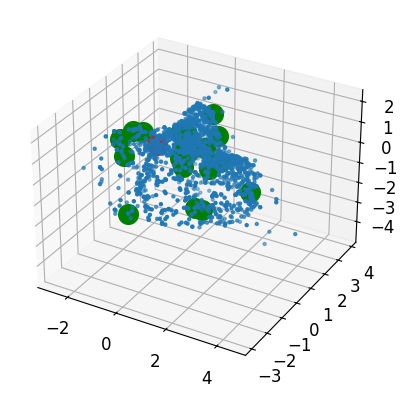

In [8]:
# Swiss roll random integer
# np.random.seed(3450)
# np.random.seed(3451)
# np.random.seed(3452)
np.random.seed(345123)
npts = data['data'].shape[0]
zs = []
n = 20
for i in range(n):
    start = np.random.randint(0,npts,size=1)
    # end = np.random.randint(0,npts,size=1)
    zs.append(torch.tensor(z[start,:]).cpu())
    # xends.append(torch.tensor(z[end,:]).cpu())
end = np.random.randint(0,npts,size=1)
# zfin = torch.tensor([[0,0,1]], dtype=torch.float32)
zfin = torch.tensor(z[end,:]).cpu() 
zbatch = torch.cat(zs,0)
zendbatch = torch.cat([zfin for i in range(n)],0)

print(zfin.shape)
print(zbatch.shape)
print(zendbatch.shape)

import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scprep.plot.scatter3d(z.detach().cpu().numpy(), ax=ax)
for i in range(zbatch.shape[0]):
    scprep.plot.scatter3d(zbatch[i].detach().cpu().numpy(), ax=ax, c='g')
    # scprep.plot.scatter2d(zhat_no_len_reg[:,i,:].detach().cpu().numpy(), ax=ax)
scprep.plot.scatter3d(zfin[0].detach().cpu().numpy(), ax=ax, c='r')

with torch.no_grad():
    xbatch = model.decoder(zbatch, unnormalize=False)
    xendbatch = model.decoder(zendbatch, unnormalize=False)

dataset = TensorDataset(xbatch, xendbatch)
dataloader = DataLoader(dataset, batch_size=len(z), shuffle=True)

In [9]:
discriminator_copy = copy.deepcopy(discriminator)
model_copy = copy.deepcopy(model)
for param in model.encoder.parameters():
    param.requires_grad = False
def func(x):
    return model.encoder(x)
for param in discriminator.parameters():
    param.requires_grad = False
def discriminator_func(x):
    return discriminator.positive_proba(x, normalize=False)

gbmodel = GeodesicBridge(
    func=func,
    input_dim=x.size(1), 
    hidden_dim=32, 
    scale_factor=1, 
    symmetric=True, 
    num_layers=3, 
    n_tsteps=100, 
    lr=1e-3, 
    weight_decay=1e-5,
    discriminator_func=discriminator_func,
    discriminator_weight=100.
)
trainer = pl.Trainer(max_epochs=200)
trainer.fit(gbmodel, dataloader)
trainer.save_checkpoint("hsphere_1.0.ckpt")

/gpfs/gibbs/pi/krishnaswamy_smita/xingzhi/.conda_envs/geosink/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:165: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /gpfs/gibbs/pi/krishnaswamy_smita/xingzhi/.conda_env ...

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/gpfs/gibbs/pi/krishnaswamy_smita/xingzhi/.conda_envs/geosink/lib/python3.11/site-packages/pytorch_lightning/trainer/setup.py:176: PossibleUserWarning:

GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.

/gpfs/gibbs/pi/krishnaswamy_smita/xingzhi/.conda_envs/geosink/lib/python3.11/site-packages/pytorch_lightning/trainer/configuration_validator.py:108: PossibleUserWarning:

You defined a

Training: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=200` reached.


In [10]:
x0, x1 = next(iter(dataloader))

In [11]:
x0, x1 = next(iter(dataloader))
with torch.no_grad():
    xhat = gbmodel(x0, x1, gbmodel.ts)

In [12]:
import torch
xshape = xhat.shape
xflatten = xhat.flatten(0,1)
with torch.no_grad():
    zhat_flatten = model.encoder(xflatten, normalize=False)
    zhat = zhat_flatten.reshape(xshape[0], xshape[1], -1)
    z0 = model.encoder(x0, normalize=False)
    z1 = model.encoder(x1, normalize=False)

In [13]:
data_amb = torch.concat([xflatten, z0, z1, x]).cpu().numpy()

In [14]:
colors = np.r_[np.ones(xflatten.shape[0])*0, np.ones(z0.shape[0])*1, np.ones(z1.shape[0])*2, np.ones(x.shape[0])*3]

In [32]:
fig = scatter(model.encoder.preprocessor.normalize(x).cpu().numpy(), s=2)
fig = scatter(x0.detach().cpu().numpy(), s=10, fig=fig)
fig = scatter(x1.detach().cpu().numpy(), s=10, fig=fig)
# fig = trajectories(longitudelines.detach().cpu().numpy(), s=5, c='blue', fig=fig)
fig = trajectories(xhat.detach().cpu().numpy(), s=10, fig=fig, title='Geodesic Bridge', filename='sroll_geod_discriminator_100.html')
fig.show()

In [16]:
fig = scatter(z.cpu().numpy(), s=2)
fig = scatter(z0.detach().cpu().numpy(), s=10, fig=fig)
fig = scatter(z1.detach().cpu().numpy(), s=10, fig=fig)
# fig = trajectories(longitudelines.detach().cpu().numpy(), s=5, c='blue', fig=fig)
fig = trajectories(zhat.detach().cpu().numpy(), s=10, fig=fig, title='Geodesic Bridge', filename='sroll_geod_discriminator_100_latent.html')
fig.show()

In [17]:
with torch.no_grad():
    xall = model.encoder.preprocessor.normalize(x_disc)
    xconc = torch.cat([xall, xhat.flatten(0, 1)])
    probs = discriminator.positive_proba(xconc, normalize=False)
scatter(xconc, probs, s=2)

In [18]:
with torch.no_grad():
    xall = model.encoder.preprocessor.normalize(x_disc)
    xconc = torch.cat([xall, xhat.flatten(0, 1)])
    probs = discriminator.positive_proba(xconc, normalize=False)
scatter(xconc, probs, s=2)

In [19]:
with torch.no_grad():
    # xall = model.encoder.preprocessor.normalize(x)
    xconc = xhat.flatten(0, 1)
    probs = discriminator.positive_proba(xconc, normalize=False)
scatter(xconc, probs, s=2)

In [20]:
with torch.no_grad():
    # xall = model.encoder.preprocessor.normalize(x)
    xconc = xhat.flatten(0, 1)
    probs = discriminator.positive_proba(xconc, normalize=False)
scatter(xconc, probs, s=2)

In [21]:
import torch

def check_model_equality(model1, model2):
    # Check if both models have the same state dict keys
    if model1.state_dict().keys() != model2.state_dict().keys():
        return False
    
    # Iterate over parameters and compare
    for (key1, param1), (key2, param2) in zip(model1.state_dict().items(), model2.state_dict().items()):
        if key1 != key2 or not torch.equal(param1, param2):
            return False
    return True

# Assuming model1 and model2 are your models
are_models_equal = check_model_equality(discriminator, discriminator_copy)
print("Models are equal:" if are_models_equal else "Models are not equal.")

Models are equal:


In [22]:
are_models_equal = check_model_equality(model, model_copy)
print("Models are equal:" if are_models_equal else "Models are not equal.")

Models are equal:


In [23]:
with torch.no_grad():
    xall = model.encoder.preprocessor.normalize(x_disc)
    xconc = torch.cat([xall, xhat.flatten(0, 1)])
    probs = discriminator.positive_proba(xconc, normalize=False)
    # out = discriminator(xconc, normalize=False)
    # probs = out[:,1]
scatter(xconc, probs, s=2).show()
probs

tensor([0.9928, 0.9817, 0.9547,  ..., 0.0187, 0.0187, 0.0187])

In [24]:
with torch.no_grad():
    xall = model.encoder.preprocessor.normalize(x_disc)
    xconc = torch.cat([xall, xhat.flatten(0, 1)]) * .1
    # probs = discriminator.positive_proba(xconc, normalize=False)
    out = discriminator(xconc, normalize=False)
    probs = out[:,1]
scatter(xconc, probs, s=2).show()
probs

tensor([-10.1999,  -9.4080, -11.7075,  ..., -12.6828, -12.6828, -12.6828])

In [25]:
x_disc

tensor([[ -6.9240,   5.7131,  -7.5636],
        [  3.4019,   6.6708, -10.7772],
        [  6.3532,   1.4607,   1.3044],
        ...,
        [  8.4008,  -5.8479,  -9.9357],
        [  7.0988,   1.9474,  -3.5870],
        [  1.3030,  13.5688,   0.0867]])

In [26]:
with torch.no_grad():
    xall = model.encoder.preprocessor.normalize(x)
    xconc = torch.cat([xall, xhat.flatten(0, 1)])
    probs = discriminator.positive_proba(xconc, normalize=False)
scatter(xconc, probs, s=2)

In [27]:
with torch.no_grad():
    # xall = model.encoder.preprocessor.normalize(x)
    # xconc = torch.cat([xall, xhat.flatten(0, 1)])
    xconc = xhat.flatten(0, 1) * 0.1
    # probs = discriminator.positive_proba(xconc, normalize=False)
    out = discriminator(xconc)
    probs = out[:,1]
scatter(xconc, probs, s=2)

In [28]:
with torch.no_grad():
    # xall = model.encoder.preprocessor.normalize(x)
    # xconc = torch.cat([xall, xhat.flatten(0, 1)])
    xconc = xhat.flatten(0, 1) * 10
    probs = discriminator.positive_proba(xconc, normalize=True)
scatter(xconc, probs, s=2)

In [29]:
with torch.no_grad():
    xall = model.encoder.preprocessor.normalize(xh)
    # xconc = torch.cat([xall, xhat.flatten(0, 1)])
    xconc = xall
    probs = discriminator.positive_proba(xconc, normalize=False)
scatter(xconc, probs, s=2)

In [30]:
with torch.no_grad():
    xall = x
    # xconc = torch.cat([xall, xhat.flatten(0, 1)])
    xconc = xall
    probs = discriminator.positive_proba(xconc, normalize=True)
scatter(xconc, probs, s=2)

In [31]:
with torch.no_grad():
    xall = model.encoder.preprocessor.normalize(x)
    # xconc = torch.cat([xall, xhat.flatten(0, 1)])
    xconc = xall
    probs = discriminator.positive_proba(xconc, normalize=False)
scatter(xconc, probs, s=2)